In [ ]:
ximport numpy as np
import matplotlib.pyplot as plt
import csv
import cv2
import math
import itertools
import urllib.request
import pandas as pd
from numpy import genfromtxt
from sklearn.linear_model import LinearRegression, BayesianRidge, SGDRegressor
from sklearn.svm import LinearSVR
from sklearn.neural_network import MLPRegressor
import sklearn.metrics as skmetrics
from ipywidgets import interact, interactive, fixed, interact_manual
from matplotlib.patches import Circle
import ipywidgets as widgets

### Functions

Defining functions for getting the errors, splitting the datasets, training the models, comparing the scores and plotting them.

In [ ]:
score_types = ["r2","mse","rmse","mae"]

def get_errors(actual_y, pred_y):
  r2 = skmetrics.r2_score(actual_y, pred_y)
  mse = skmetrics.mean_squared_error(actual_y, pred_y)
  rmse = skmetrics.mean_squared_error(actual_y, pred_y, squared = False)
  mae = skmetrics.mean_absolute_error(actual_y, pred_y)
  return {
      "r2":r2,
      "mse":mse,
      "rmse":rmse,
      "mae":mae,
  }

def split(albedo, fe, k, th, ti):
  chemicals = np.array(list(zip(albedo, fe, k, th, ti)))
  n = len(chemicals)//2
  train_set = chemicals[:n]
  test_set = chemicals[n:]
  train_set_x, train_set_y = train_set[:,1:], train_set[:,0]
  test_set_x, test_set_y  = test_set[:,1:], test_set[:,0]
  return train_set_x, train_set_y, test_set_x, test_set_y

def train_model(albedo, fe, k, th, ti):
  #Data processing. Create train and test sets by splitting the image in a half.
  train_set_x, train_set_y, test_set_x, test_set_y = split(albedo, fe, k, th, ti)

  model = LinearRegression().fit(train_set_x, train_set_y)
  #model = MLPRegressor(random_state=1, max_iter=500).fit(train_set_x, train_set_y)
  #model = LinearSVR(max_iter=3000).fit(train_set_x, train_set_y)
  return model

def score_comparison(albedo_resolution, datasets_img, test=None):
  model = train_model(albedo_resolution.flatten(), datasets_img['fe'].flatten(), datasets_img['k'].flatten(), datasets_img['th'].flatten(), datasets_img['ti'].flatten())
  train_set_x, train_set_y, test_set_x, test_set_y = split(albedo_resolution.flatten(), datasets_img['fe'].flatten(), datasets_img['k'].flatten(), datasets_img['th'].flatten(), datasets_img['ti'].flatten())
  if test is not None:
    _, _, test_set_x, test_set_y = split(test.flatten(), datasets_img['fe'].flatten(), datasets_img['k'].flatten(), datasets_img['th'].flatten(), datasets_img['ti'].flatten())

  pred_y = model.predict(test_set_x)
  return get_errors(test_set_y, pred_y)


def plot_scores(x_axis, scores, title=None):
  fig, axs = plt.subplots(1, 4, figsize=(25,5))
  if title:
    fig.suptitle(title)
  for i,score_type in enumerate(score_types):
    y_axis = [score[score_type] for score in scores]
    axs[i].plot(x_axis, y_axis)
    axs[i].set_title(f"{score_type}")

Defining functions for generating the error map, plotting the predictions and plotting the figures side by side.

In [ ]:
def error_map(correct, predicted):
  error_img = np.abs(predicted-correct)
  avg_error = np.average(error_img.flatten())
  return error_img, avg_error

def plot_prediction(correct, predicted, other=None):
  fig,axs = plt.subplots(1,3,figsize=(25,5))
  if other is None:
    other = correct

  axs[0].set_title("Training img")
  im = axs[0].imshow(other, vmin=0.10, vmax=0.5)
  plt.colorbar(im,ax=axs[0])

  axs[1].set_title("Prediction img")
  im = axs[1].imshow(predicted, vmin=0.10, vmax=0.5)
  plt.colorbar(im,ax=axs[1])  

  error_img, avg_error = error_map(correct, predicted)
  errors = get_errors(correct.flatten(), predicted.flatten())
  axs[2].set_title(f"MAE: {errors['mae']:.2f}, MSE: {errors['mse']:.2f}, RMSE: {errors['rmse']:.2f}, R2: {errors['r2']:.2f}")
  im = axs[2].imshow(error_img, cmap='gray', vmax=0.2)
  plt.colorbar(im, ax=axs[2])

  #plt.figure()
  #plt.title("Error distribution")
  #plt.hist(error_img.flatten(), bins=100);

def plot_side_by_side(img1, img2, figsize=(30,45), vmin=0.1, vmax=0.5, title=None):
  plt.figure(figsize=figsize)
  x= np.zeros((3,len(img1))).T
  plt.imshow(np.concatenate([img1,x, img2],axis=1), vmin=vmin, vmax=vmax)
  if title:
    plt.title(title)

Defining the blurring functions.

In [ ]:
def gaussianKernel(size, sigma):
    kernel =  np.fromfunction(lambda x, y: (1/(2*math.pi*sigma**2)) * math.e ** ((-1*((x-(size-1)/2)**2+(y-(size-1)/2)**2))/(2*sigma**2)), (size, size))
    return kernel / np.sum(kernel)

def gaussianBlurAdaptative(img, kSize, kSigma):
    assert kSize % 2 == 1
    kernel = gaussianKernel(kSize, kSigma)
    d = int((kSize-1)/2)
    my,mx, = img.shape
    gaussian = np.zeros((my,mx))
    sigmas =  np.zeros((my,mx))
    ksizes =  np.zeros((my,mx))
    for y in range(my):
        if y < 180:
          diameterRatio = y
        else:
          diameterRatio = my-y
        kSigma2 = max(1,(kSigma * (diameterRatio/180)))
        for x in range(mx):
            sigmas[y][x] = kSigma2
            #borders
            y1 = min(d,y)
            if d+y > my-1:
              y2 = my-1-y
            else:
              y2 = d
            x1 = min(d,x)
            if d+x > mx-1:
              x2 = mx-1-x
            else:
              x2 = d
            d3 = min(y1,y2,x1,x2)
            img2 = img[y-d3:y+d3+1,x-d3:x+d3+1]
            kernel2 = gaussianKernel(min(img2.shape), kSigma2)
            ksizes[y][x] = min(img2.shape)

            gaussian[y][x] = np.sum(np.multiply(img2, kernel2))
    return gaussian,sigmas,ksizes

Defining functions for getting and applying the masks.

In [ ]:
def get_mask(img):
  pixels = []
  for row in img:
    for element in row:
      if element == 0:
        pixels.append(0)
      else:
        pixels.append(1)
  return np.array(pixels).reshape(img.shape)

def apply_masks(image, masks):
  for mask in masks:
    assert image.shape == mask.shape
  new_image = np.array(image)
  n_rows, n_columns = image.shape
  for i in range(n_rows):
    for j in range(n_columns):
      for mask in masks:
        if mask[i][j] == 0:
          new_image[i][j] = 0
  return new_image

def apply_masks_to_imgs_flatten(images, masks):
  for mask in masks:
    for image in images:
      assert image.shape == mask.shape
  new_images = []
  for image in images:
    new_image = []
    n_rows, n_columns = image.shape
    for i in range(n_rows):
      for j in range(n_columns):
        new_image.append(image[i][j])
        for mask in masks:
          if mask[i][j] == 0:
            new_image.pop()
            break
    new_images.append(new_image)
  return new_images

## Moon

Data loading.
Load the datasets directly from Github.

In [ ]:
def get_datasets():
  datasets_links = {"light": "Albedo_Map.csv",
                  "fe" : "LPFe_Map.csv",
                  "k" : "LPK_Map.csv",
                  "th" : "LPTh_Map.csv",
                  "ti" : "LPTi_Map.csv"
                  }

  datasets_img = {} #2-D array of pixels

  for key, value in datasets_links.items():
    response = urllib.request.urlopen('https://raw.githubusercontent.com/ML4SCI/ML4SCI_GSoC/main/Messenger/Moon/'+value)
    lines = [l.decode('utf-8') for l in response.readlines()]
    datasets_img[key] = genfromtxt(lines, delimiter=',')
  return datasets_img

datasets_img = get_datasets()

Here we present the original Moon and the blurred version together with the difference after performing the blurring.

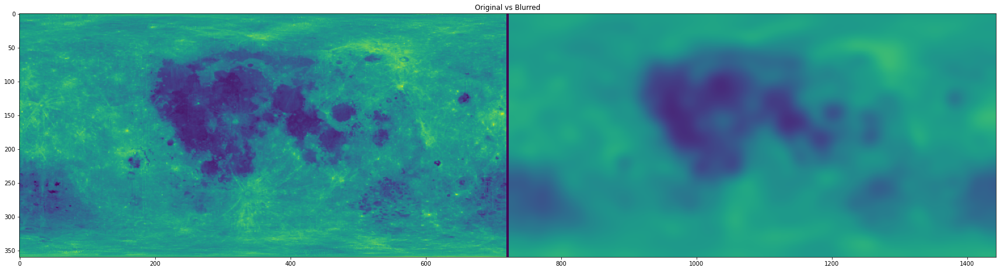

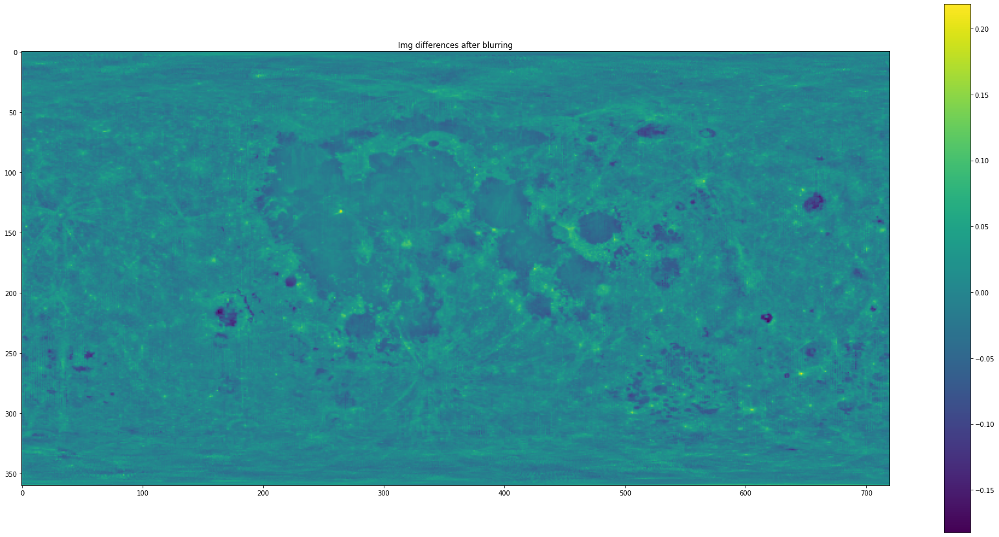

In [ ]:
light_original = datasets_img["light"]
light_blur = cv2.GaussianBlur(datasets_img["light"], ksize=(0,0), sigmaX = 9)

plot_side_by_side(light_original,light_blur, title="Original vs Blurred")


plt.figure(figsize=(30,15))
plt.title("Img differences after blurring")
plt.imshow((light_original-light_blur))
plt.colorbar();

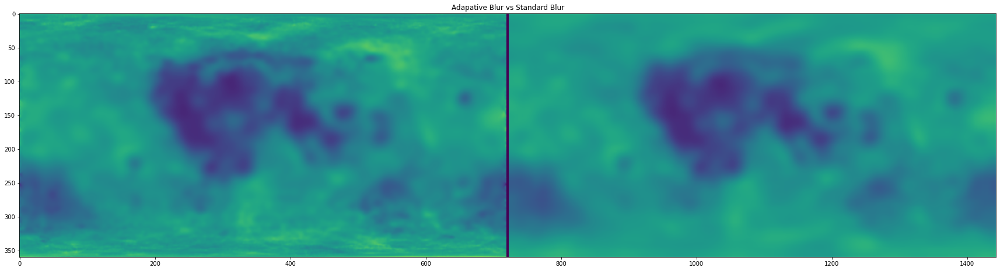

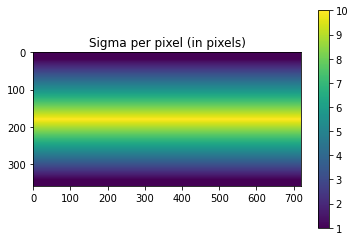

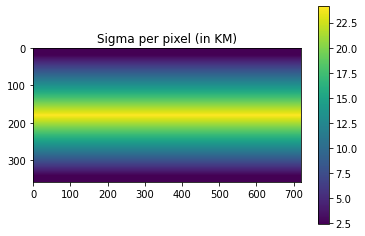

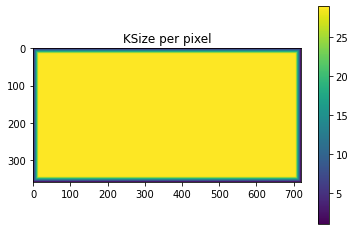

In [ ]:
z1,sigmas,ksizes = gaussianBlurAdaptative(datasets_img['light'], 29,10)
z2 = cv2.GaussianBlur(datasets_img['light'], ksize=(29,29), sigmaX=10)
plot_side_by_side(z1,z2, title="Adapative Blur vs Standard Blur")

plt.figure()
plt.imshow(sigmas)
plt.colorbar()
plt.title("Sigma per pixel (in pixels)")

plt.figure()
plt.imshow(1737*sigmas/720)
plt.colorbar()
plt.title("Sigma per pixel (in KM)")

plt.figure()
plt.imshow(ksizes)
plt.title("KSize per pixel")
plt.colorbar()

## Parameter selection
We specify different ranges of values for ksize and sigma and also several types of borders for downscaling. These values will be used in our experiments to identify the best combination.

In [ ]:
ksizes = [0]+list(range(1,30,2))
sigmas = np.linspace(0.1,40,20)
borders = [cv2.BORDER_REPLICATE, cv2.BORDER_REFLECT, cv2.BORDER_DEFAULT]

### Sigma
Here we search for the best sigma value.

In [ ]:
scores_by_sigma = []
for sigma in sigmas:
  albedo_resolution = cv2.GaussianBlur(datasets_img["light"], ksize=(0,0), sigmaX=sigma)
  #score = score_comparison(albedo_resolution, datasets_img, test=datasets_img["light"])
  score = score_comparison(albedo_resolution, datasets_img, test=albedo_resolution)
  scores_by_sigma.append(score)

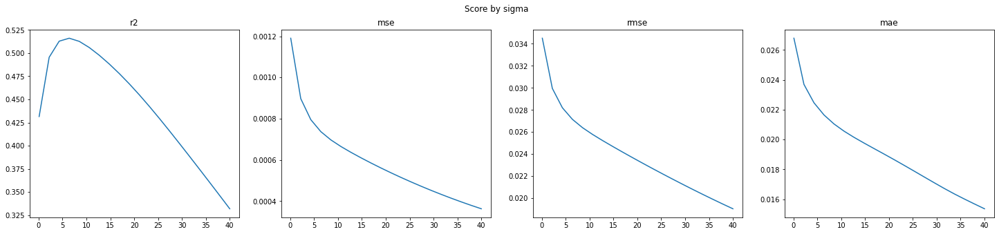

In [ ]:
plot_scores(sigmas, scores_by_sigma, title="Score by sigma")

In [ ]:
sigmas = np.linspace(0.1,40,10)
scores_by_sigma = []
for sigma in sigmas:
  albedo_resolution,_,_ = gaussianBlurAdaptative(datasets_img["light"],29,sigma)
  #score = score_comparison(albedo_resolution, datasets_img, test=datasets_img["light"])
  score = score_comparison(albedo_resolution, datasets_img, test=albedo_resolution)
  scores_by_sigma.append(score)

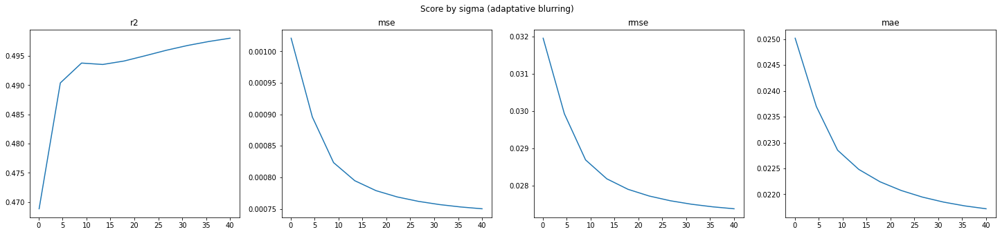

In [ ]:
plot_scores(sigmas, scores_by_sigma, title="Score by sigma (adaptative blurring)")

We observe that in general, the higher the sigma, the better the model performs. However, we might be simplifying the prediction task by blurring so much the image and removing the high frequency components.

Thus, we choose a value of sigma that provides good results without blurring too much the image.

Idea: Train the model with the blurred image but test against the original one.

In [ ]:
best_sigma = 9

### kSize
Here we search for the best ksize value. We rely on the best sigma value that we have identified.

In [ ]:
scores_by_ksize = []
for ksize in ksizes:
  albedo_resolution = cv2.GaussianBlur(datasets_img["light"], ksize=(ksize,ksize), sigmaX=best_sigma)
  #score = score_comparison(albedo_resolution, datasets_img, test=datasets_img["light"])
  score = score_comparison(albedo_resolution, datasets_img, test=albedo_resolution)
  scores_by_ksize.append(score)

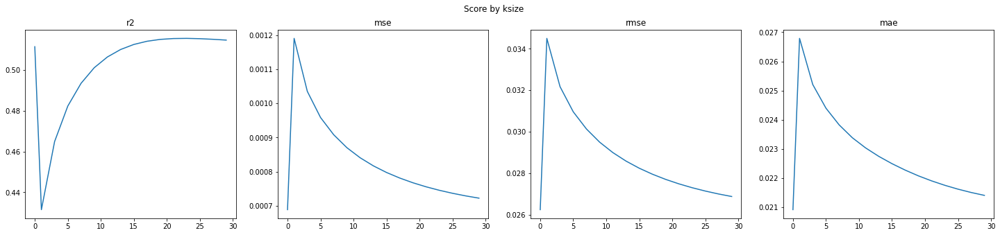

In [ ]:
plot_scores(ksizes, scores_by_ksize, title="Score by ksize")

Once again, the more blurry, the better the results are. We will use the default value "0", which automatically tunes the value based on the sigma and which seems to perform quite well.

In [ ]:
best_ksize = (0,0)

 ### Border
 Next, we will choose the best border type.



In [ ]:
scores_by_border = []
labels =  ["Replicate", "Reflect", "Default"]
for border in borders:
  albedo_resolution = cv2.GaussianBlur(datasets_img.get("light"), ksize=best_ksize, sigmaX=best_sigma, borderType=border)
  #score = score_comparison(albedo_resolution, datasets_img, test=datasets_img["light"])
  score = score_comparison(albedo_resolution, datasets_img, test=albedo_resolution)
  scores_by_border.append(score)

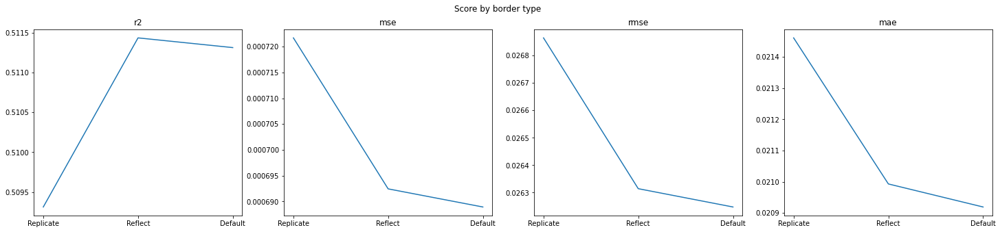

In [ ]:
plot_scores(labels, scores_by_border, "Score by border type")

The default downscaling method seems to be the one providing the best results, therefore we will stick with it.

## Prediction analysis
Next, we will analyse the prediction obtained by using the optimal set of parameters.

### Model training
We train the model with different combination of parameters.

In [ ]:
fe,k,th,ti = datasets_img['fe'].flatten(), datasets_img['k'].flatten(), datasets_img['th'].flatten(), datasets_img['ti'].flatten()
original = datasets_img["light"]
train_set_x, train_set_y, test_set_x, test_set_y = split(datasets_img['light'].flatten(), fe,k,th,ti)

In [ ]:
light1 = datasets_img["light"]
light2 = cv2.GaussianBlur(datasets_img["light"], ksize=(1,1), sigmaX = best_sigma)
light3 = cv2.GaussianBlur(datasets_img["light"], ksize=(15,15), sigmaX = best_sigma)
light4 = cv2.GaussianBlur(datasets_img["light"], ksize=(31,31), sigmaX = best_sigma)
light5 = cv2.GaussianBlur(datasets_img["light"], ksize=best_ksize, sigmaX = best_sigma)
light6 = cv2.GaussianBlur(datasets_img["light"], ksize=best_ksize, sigmaX = 100)

model1 = train_model(light1.flatten(), fe,k,th,ti)
model2 = train_model(light2.flatten(), fe,k,th,ti)
model3 = train_model(light3.flatten(), fe,k,th,ti)
model4 = train_model(light4.flatten(), fe,k,th,ti)
model5 = train_model(light5.flatten(), fe,k,th,ti)
model6 = train_model(light6.flatten(), fe,k,th,ti)
models = [model1, model2, model3, model4, model5,model6]
for i,model in enumerate(models):
  print(i)
  predicted = model.predict(test_set_x)
  print(f"r2: {skmetrics.r2_score(test_set_y,predicted)}")
  print(f"rmse: {skmetrics.mean_squared_error(test_set_y,predicted,squared=False)}")
  print()

0
r2: 0.4315049105022408
rmse: 0.03450330544342186

1
r2: 0.4315049105022408
rmse: 0.03450330544342186

2
r2: 0.42927681095823766
rmse: 0.03457085362641906

3
r2: 0.42573018397114504
rmse: 0.03467810354338298

4
r2: 0.42355360855255997
rmse: 0.03474375919945548

5
r2: 0.20264210631731905
rmse: 0.040862411496800546



We choose the model with the best parameters.

In [ ]:
light_original = datasets_img["light"]
model1 = train_model(light_original.flatten(),fe,k,th,ti)

In [ ]:
light_blur = cv2.GaussianBlur(datasets_img["light"], ksize=best_ksize, sigmaX = best_sigma)
model2 = train_model(light_blur.flatten(),fe,k,th,ti)

Since we are using Linear Regression, we can obtain the coefficients of the polynomial easily. At this point we compare them against the correlations to try to see some pattern.

                      fe          k         th        ti
    model.coef_    1.035e-02  2.975e-06 -2.819e-03 -5.259e-03 
    correlation: -0.811343   -0.548442  -0.574907  -0.683682

As we can see, the coefficents are significantly related to the correlationship. It might be worth highlighting that probably the coeff of k is so low because it is super correlated with th (0.937672). So you can predict just by using one of the 2, so the model is kind of ignoring k.

### Predicition
Finally, we generate predicted images based on ML Model in both: the original Moon and the blurred version of it.

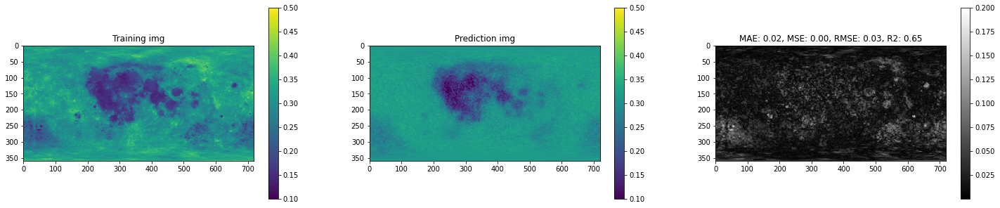

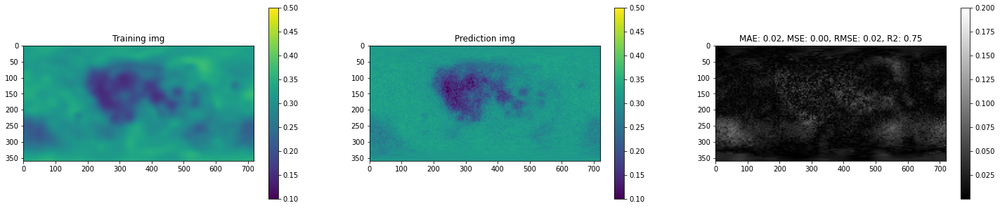

In [ ]:
predicted = np.concatenate([model1.predict(train_set_x), model1.predict(test_set_x)])
predicted = predicted.reshape(360,720)
predicted2 = np.concatenate([model2.predict(train_set_x), model2.predict(test_set_x)])
predicted2 = predicted2.reshape(360,720)
plot_prediction(light_original, predicted)
plot_prediction(light_blur, predicted2, light_blur)

We plot the according error maps.

Average difference per pixel: 0.0021468324299472596


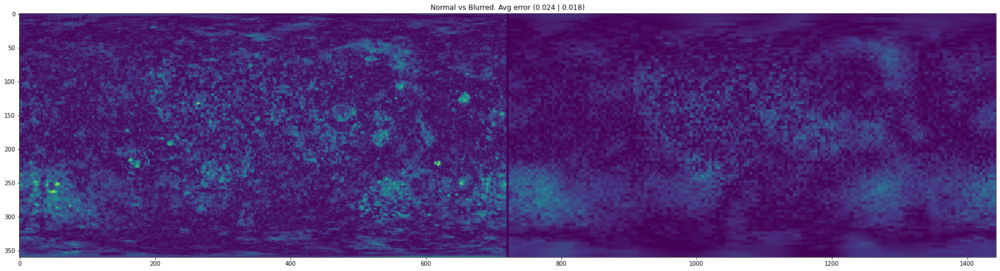

In [ ]:
error_img1, avg_error1 = error_map(light_original, predicted)
error_img2, avg_error2 = error_map(light_blur, predicted2)
plot_side_by_side(error_img1, error_img2,vmax=0.2,vmin=0., title=f"Normal vs Blurred. Avg error ({avg_error1:.3f} | {avg_error2:.3f})")
print(f"Average difference per pixel: {np.average(np.abs(predicted-predicted2))}")

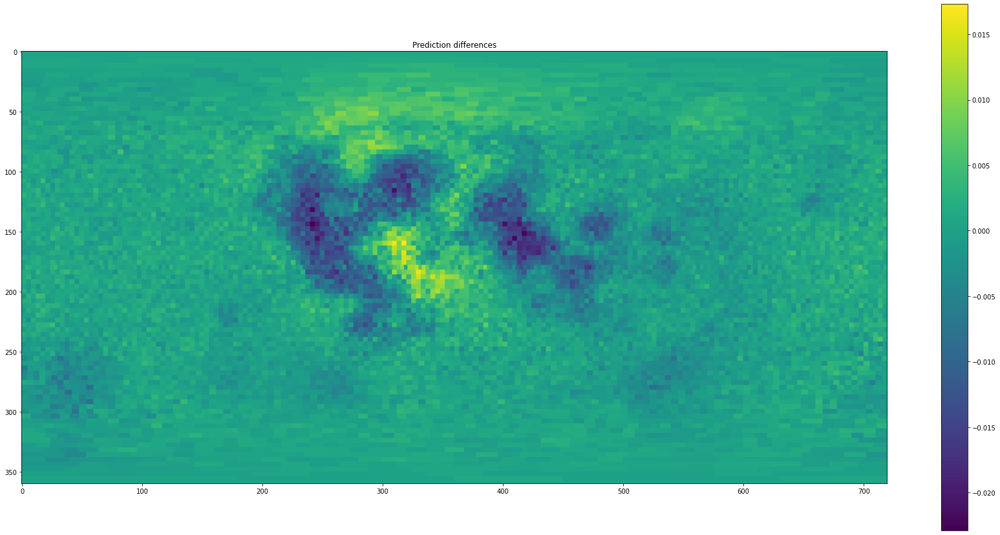

In [ ]:
plt.figure(figsize=(30,15))
plt.title("Prediction differences")
plt.imshow((predicted-predicted2))
plt.colorbar();

Let's take a look at the prediction and the result of the blurring with more detail.

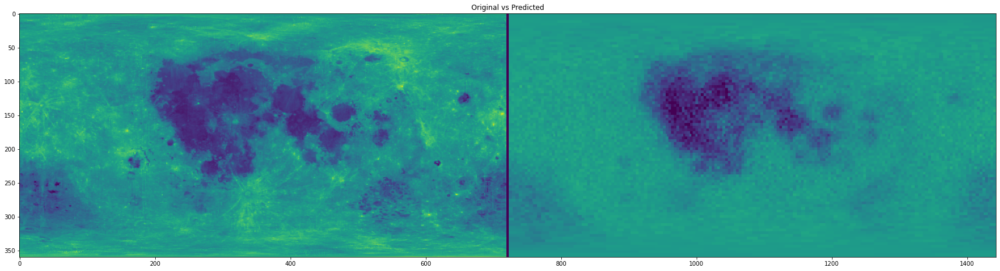

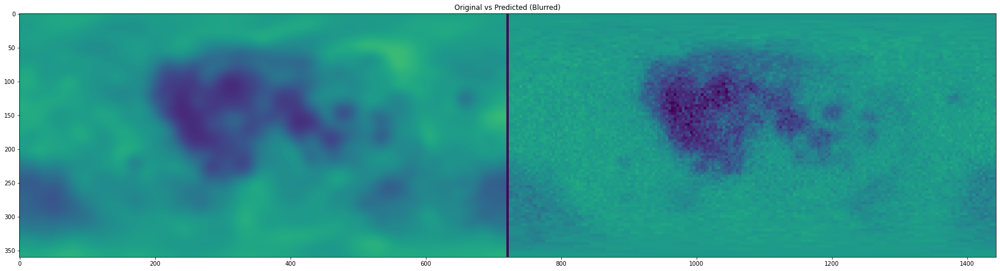

In [ ]:
plot_side_by_side(light_original,predicted, title="Original vs Predicted")
plot_side_by_side(light_blur, predicted2,title="Original vs Predicted (Blurred)")

The prediction is fairly good but still it is not great on some parts of the image and the level of detail is a bit poor, although is probably due to the lower detail of the material maps.

Let´s check the error map.

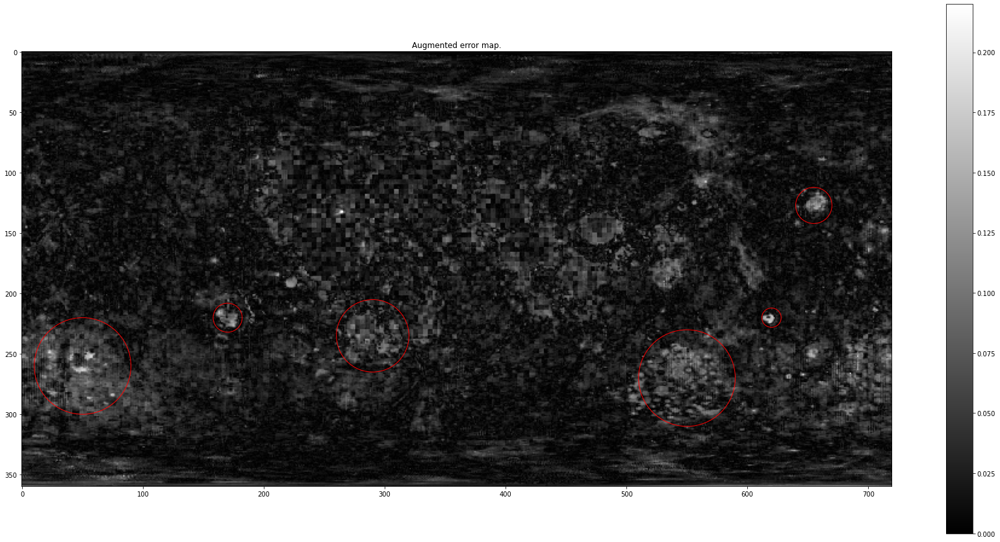

In [ ]:
f = plt.figure(figsize=(30,15))
error_img = np.abs(predicted-original)
im = plt.imshow(error_img, cmap='gray', vmin=0., vmax=0.22)
plt.colorbar()
plt.title("Augmented error map.")

c = Circle((50,260),40, fill=False, edgecolor="red")
f.axes[0].add_patch(c)
c = Circle((550,270),40, fill=False, edgecolor="red")
f.axes[0].add_patch(c)
c = Circle((290,235),30, fill=False, edgecolor="red")
f.axes[0].add_patch(c)
c = Circle((655,127),15, fill=False, edgecolor="red")
f.axes[0].add_patch(c)
c = Circle((170,220),12, fill=False, edgecolor="red")
f.axes[0].add_patch(c)
c = Circle((620,220),8, fill=False, edgecolor="red")
f.axes[0].add_patch(c)

Next, we created an interactive masked error map. The threshold can be changed using the slider. Moreover, the saturated option allows to see which error each pixel has.

In [ ]:
x = np.abs(predicted-original)
@interact(saturate=True, mask_threshold=widgets.FloatSlider(min=0., max=0.12, step=0.01, value=0.04))
def g(saturate, mask_threshold):
  f = plt.figure(figsize=(30,15))
  x1 = x.copy()
  x1 = np.ma.masked_where(x1 < mask_threshold, x1)
  if saturate:
    x1[x1 >= mask_threshold] = 1
  error_img = x1
  im = plt.imshow(error_img, cmap='Greys', vmax=0.12)#, cmap='Reds', vmin=0., vmax=0.2)
  plt.title("Masked error map.")
  plt.colorbar()

interactive(children=(Checkbox(value=True, description='saturate'), FloatSlider(value=0.04, description='mask_…

In [ ]:
predicted_moon = predicted
predicted_moon_blur = predicted2

We see that some parts of the image have a significantly higher error.

Idea: Analyze better those parts of the image. Are those parts the same correlated with the rest of elements? If not, we might not be able to improve our predictions.

### Mercury

Data loading.
Load the datasets directly from Github.

In [ ]:
datasets_links = {"top_light": "mercury-albedo-top-half.png.csv",
                  "bottom_light" : "mercury-albedo-resized-bottom-half.png.csv",
            "alsi" : "alsimap_smooth_032015.png.csv",
            "casi" : "casimap_smooth_032015.png.csv",
            "fesi" : "fesimap_smooth_032015.png.csv",
            "mgsi" : "mgsimap_smooth_032015.png.csv",
            "ssi" : "ssimap_smooth_032015.png.csv"
            }

datasets_mercury = {}

for key, value in datasets_links.items():
    response = urllib.request.urlopen('https://raw.githubusercontent.com/ML4SCI/ML4SCI_GSoC/main/Messenger/Mercury/'+value)
    lines = [l.decode('utf-8') for l in response.readlines()]
    datasets_mercury[key] = genfromtxt(lines, delimiter=',')
datasets_mercury["all_light"] = np.concatenate((datasets_mercury["top_light"], datasets_mercury["bottom_light"]))

In [ ]:
chemicals = ["alsi", "casi", "fesi", "mgsi", "ssi"]
datasets_chemicals = {}

for chemical in chemicals:
  datasets_chemicals[chemical] = cv2.resize(datasets_mercury[chemical], (1440,1440))

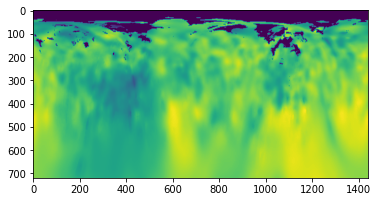

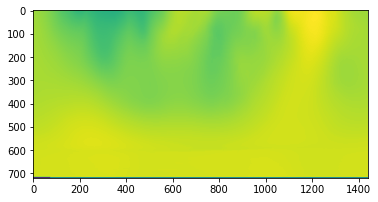

In [ ]:
def split_image(img):
  n,m = img.shape
  img1 = img[:n//2][:]
  img2 = img[n//2:][:]
  return img1, img2
  
a1,a2 = split_image(datasets_chemicals["alsi"])
plt.figure()
plt.imshow(a1)
plt.figure()
plt.imshow(a2)

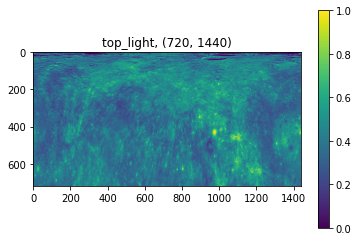

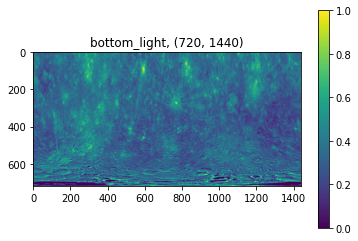

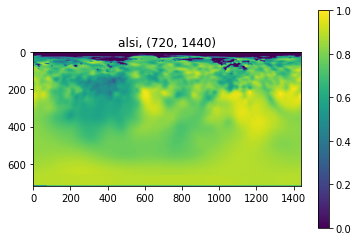

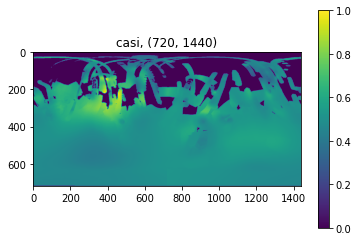

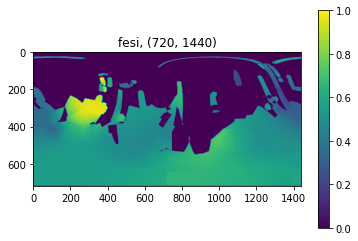

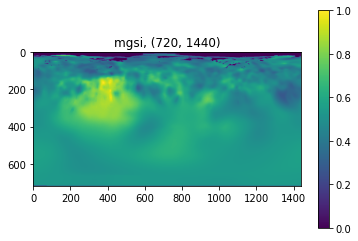

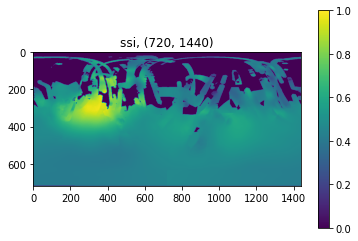

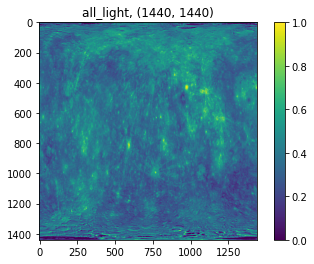

In [ ]:
for i, (name, img) in enumerate(datasets_mercury.items()):
    plt.figure(i)
    plt.title(f"{name}, {img.shape}")
    plt.imshow(img, vmin=0, vmax=1)#, cmap='gray')
    plt.colorbar()

In [ ]:
masks = []
for chemical in chemicals:
  masks.append(get_mask(datasets_chemicals[chemical]))

Text(0.5, 1.0, 'Masked Albedo')

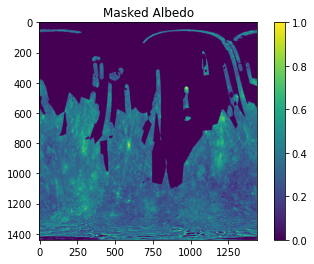

In [ ]:
masked_albedo = apply_masks(datasets_mercury["all_light"], masks)
plt.imshow(masked_albedo)
plt.colorbar()
plt.title("Masked Albedo")

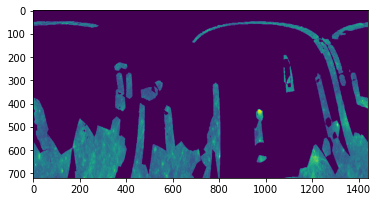

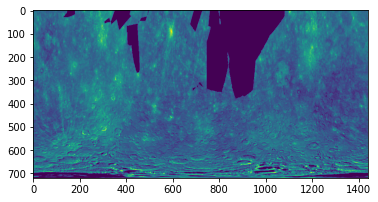

In [ ]:
a1,a2 = split_image(masked_albedo)
plt.figure()
plt.imshow(a1)
plt.figure()
plt.imshow(a2)

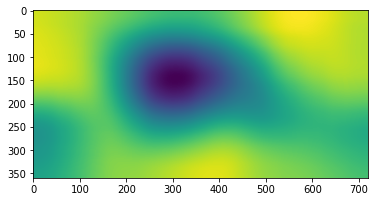

In [ ]:
z=cv2.GaussianBlur(datasets_img['light'], ksize=(199,199), sigmaX=70)
plt.imshow(z)

### Moon with Mercury mask -> Mooncury

In [ ]:
resized_masks = []
for mask in masks:
    resized_masks.append(cv2.resize(mask.astype('float32'), (720,360), interpolation = cv2.INTER_AREA))

In [ ]:
light_flat,fe_flat,k_flat,ti_flat,th_flat = apply_masks_to_imgs_flatten([datasets_img["light"],datasets_img["fe"],datasets_img["k"],datasets_img["ti"],datasets_img["th"]], resized_masks)

In [ ]:
z=datasets_img["light"].flatten().shape[0]
print(f"Pixels without mask: {z}")
print(f"Pixels with mask: {len(light_flat)}")

Pixels without mask: 259200
Pixels with mask: 148872


In [ ]:
model = train_model(light_flat, fe_flat, k_flat, th_flat, ti_flat)
train_set_x, train_set_y, test_set_x, test_set_y = split(light_flat, fe_flat, k_flat, th_flat, ti_flat)
predicted = model.predict(test_set_x)
print("Metrics of model with mask on test set")
print(f"r2: {skmetrics.r2_score(test_set_y,predicted)}")
print(f"rmse: {skmetrics.mean_squared_error(test_set_y,predicted,squared=False)}")
print(f"mae: {skmetrics.mean_absolute_error(test_set_y,predicted)}")

Metrics of model with mask on test set
r2: 0.3286608176445993
rmse: 0.032747971443078956
mae: 0.025609712743861777


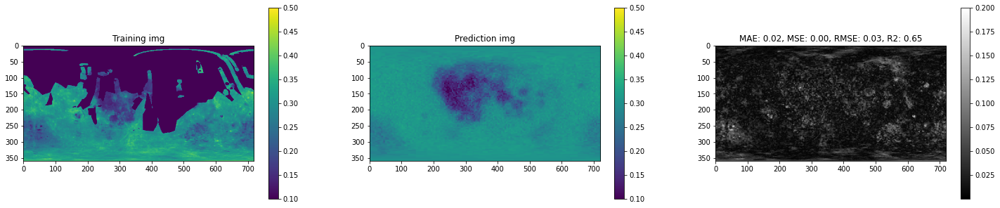

In [ ]:
train_set_x, train_set_y, test_set_x, test_set_y = split(datasets_img['light'].flatten(), fe,k,th,ti)
plot_prediction(datasets_img['light'], np.concatenate([model.predict(train_set_x), model.predict(test_set_x)]).reshape(360, 720), other=apply_masks(datasets_img['light'],resized_masks))

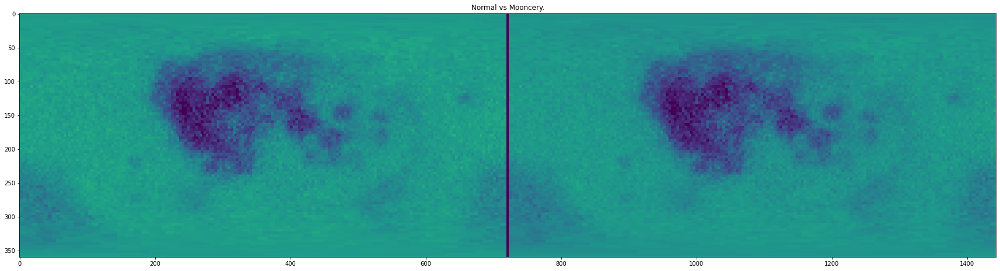

In [ ]:
plot_side_by_side(predicted_moon, np.concatenate([model.predict(train_set_x), model.predict(test_set_x)]).reshape(360, 720),vmax=0.5,vmin=0.1, title=f"Normal vs Mooncury.")

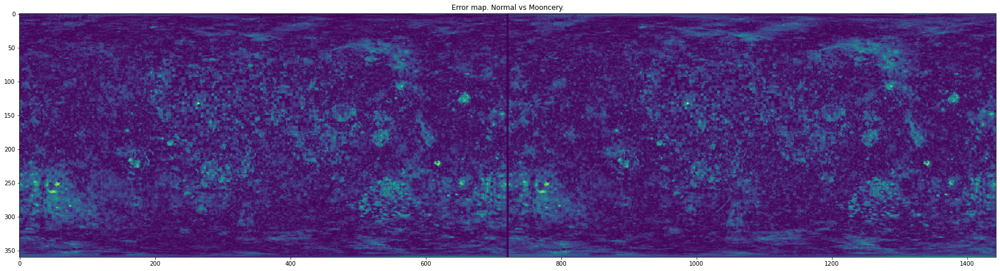

In [ ]:
x = np.abs(datasets_img['light'] - predicted_moon)
y = np.abs(datasets_img['light'] - np.concatenate([model.predict(train_set_x), model.predict(test_set_x)]).reshape(360, 720))
plot_side_by_side(x, y,vmax=0.2,vmin=0., title=f"Error map. Normal vs Mooncury.")

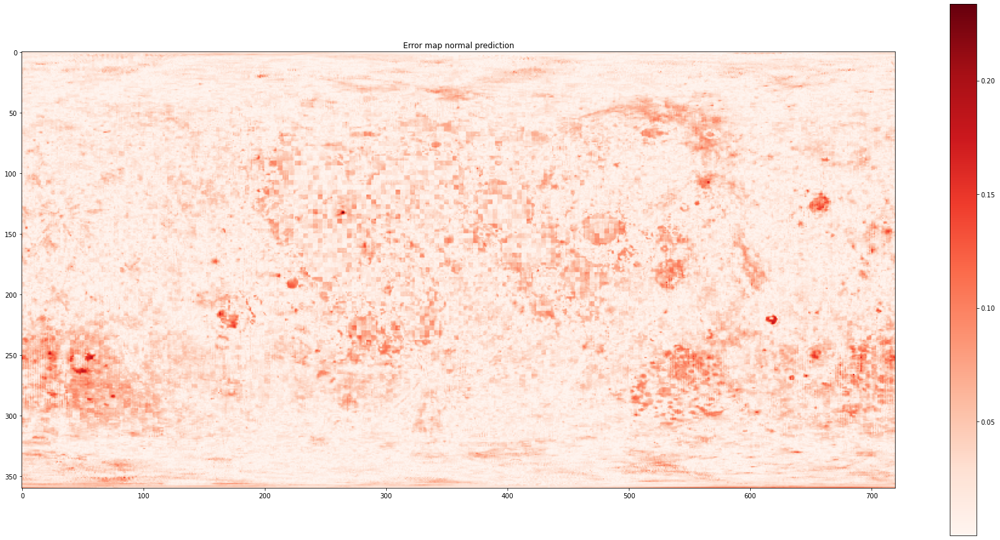

In [ ]:
plt.figure(figsize=(30,15))
plt.title("Error map normal prediction")
plt.imshow(x, cmap='Reds')
plt.colorbar();

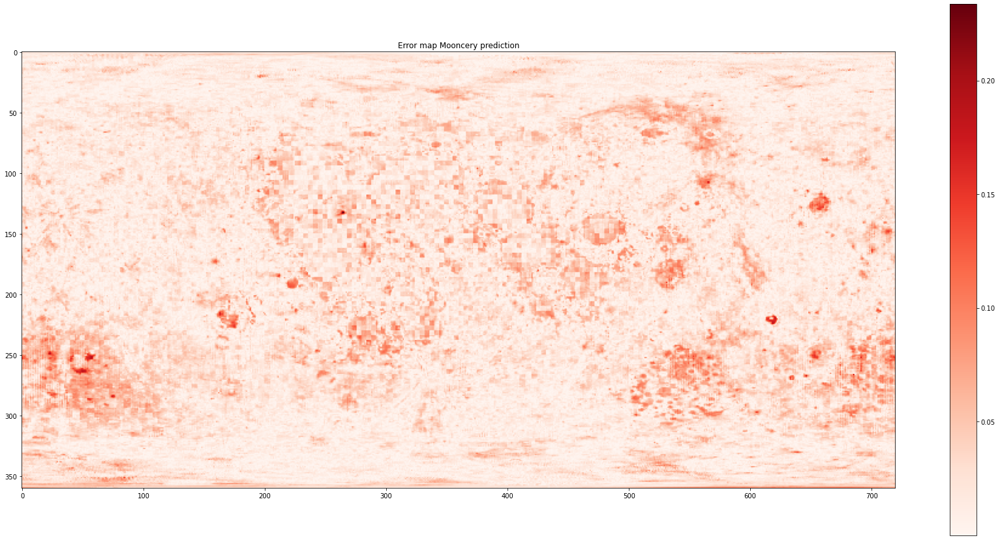

In [ ]:
plt.figure(figsize=(30,15))
plt.title("Error map Mooncury prediction")
plt.imshow(x, cmap='Reds')
plt.colorbar();